# ✔️ Problem Formulation
--------------------
------------------------------


## ✔️Define the problem:

- The important part before starting to do any thing, we understand the problem very well to be able to be soundness about features you need and features have effect on your prediction.
   
- One of the biggest problems when people prepare to post a new listing on airbnb is, how much should one ask for? Of course the most intuitive way is to check how other similar postings price their apartment/house. 

- Our goal of this problem is to predict the listing price based on the listing characteristics 🔥🔥, in this way to optimize user experience and lower the bar to be a new host😍 !

- This is a multimodality task which is to estimate the price of an Airbnb listing using multi class classification based on the photo and description provided.

- The price of a new listing, as well as the type of rental being promoted, is predicted using a 

# Libaraies
-------------
------------

In [2]:
!pip install langdetect
!pip install deep_translator
!pip install -q focal-loss
!pip install seaborn

In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
from PIL import Image
from langdetect import detect
from deep_translator import GoogleTranslator
from focal_loss import SparseCategoricalFocalLoss
# preprocess text data
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from pprint import pprint
import collections
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPool2D , Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.data import AUTOTUNE
from tensorflow.keras.models import save_model

# Read Data
-------------
-------------------

In [4]:
data =  pd.read_csv(r"C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-873-dm-w23-a4\a4\train_xy.csv")
submission_data = pd.read_csv(r"C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-873-dm-w23-a4\a4\test_x.csv")
print('Shape of data' ,data.shape)
print('Shape of submission_data ', submission_data.shape)

Shape of data (7627, 4)
Shape of submission_data  (7360, 3)


In [ ]:
data.head()

,summary,image,type,price
0,"Spacious, sunny and cozy modern apartment in t...",img_train/0.jpg,Apartment,1
1,Located in one of the most vibrant and accessi...,img_train/1.jpg,Apartment,0
2,Logement coquet et douillet à 10 minutes du ce...,img_train/2.jpg,Apartment,1
3,"Beautiful and spacious (1076 sc ft, / 100 mc) ...",img_train/3.jpg,Apartment,1
4,Très grand appartement ''rustique'' et très ag...,img_train/4.jpg,Apartment,0


In [15]:
submission_data.head()

,id,summary,image
0,0,Charming warm house is ready to host you here ...,img_test/0.jpg
1,1,"La chambre est spacieuse et lumineuse, dans un...",img_test/1.jpg
2,2,Grande chambre confortable située au sous-sol ...,img_test/2.jpg
3,3,"Près d’un Métro, ligne orange. 10 minutes à pi...",img_test/3.jpg
4,4,Very bright appartment and very cosy. 2 separa...,img_test/4.jpg


In [13]:
data['image'] = 'C:\\Users\\LAB\\Videos\\flash_new_1\\copy-of-cisc-873-dm-w23-a4\\a4\\'+data['image']
submission_data['image'] ='C:\\Users\\LAB\\Videos\\flash_new_1\\copy-of-cisc-873-dm-w23-a4\\a4\\'+submission_data['image']
data.head()

,summary,image,type,price,translated_summary
0,"Spacious, sunny and cozy modern apartment in t...",C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-8...,Apartment,1,"Spacious, sunny and cozy modern apartment in t..."
1,Located in one of the most vibrant and accessi...,C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-8...,Apartment,0,Located in one of the most vibrant and accessi...
2,Logement coquet et douillet à 10 minutes du ce...,C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-8...,Apartment,1,Pretty and cozy accommodation 10 minutes from ...
3,"Beautiful and spacious (1076 sc ft, / 100 mc) ...",C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-8...,Apartment,1,"Beautiful and spacious (1076 sc ft, / 100 mc) ..."
4,Très grand appartement ''rustique'' et très ag...,C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-8...,Apartment,0,Very large ''rustic'' and very pleasant apartm...


**Obeservation**

- As you can see, we have about 7627 rows and 4 colums in train set. On the other hand, we have about 7360 rows and 3 columns in test set 
- Both train and test sets have common columns : summary and image columns ( features that help us in predicting type and price)
- Our target columns are type and price 

Let's move on to explore and know more about our data 

# Helper Function
----------------
-----------------

In [5]:
class Explore_Data:
    
    
    def __init__(self, dataframe):
        self.dataframe = dataframe
        
        
    #------------------------------- Check null ^_^ ------------------------------------
    '''
    This function counts null in each column in the dataframe and calculate the percent of nulls in the column then return the 
    dataframe consist of 2 columns :  one contains count of null values in each column and second contains percent 
    '''
    def null_values(self , plot =True):
        null_val = pd.DataFrame(self.dataframe.isnull().sum())
        null_val.columns = ['null_val']
        null_val['percent_'] = round(null_val['null_val'] / len(self.dataframe.index), 2) * 100
        null_val = null_val.sort_values('percent_', ascending = False)
        if plot:
            sns.heatmap(self.dataframe.isnull(), cbar=False)
        return null_val
    #------------------------------- Check duplication ^_^  ------------------------------------
    '''
    This function counts duplicated rows in the dataframe 
    '''
    def duplicated_values(self):
        return print("Number of duplicated rows" , self.dataframe.duplicated().sum())
    
    #------------------------------- CHECK CONSTANT FEATURES ^_^  ------------------------------------
    '''
    This function returns the columns that contain one value a cross all samples
    '''
    def constant_columns(self):
        constant_columns = [[col ,self.dataframe[col].value_counts()] for col in self.dataframe.columns if (self.dataframe[col].nunique()) == 1]
        return constant_columns
    
        
    #--------------------------------------- cardinality ^_^ ---------------------------------------   
    '''
    calculate unique values in each column and returns dataframe consists of count and percent. This helps us to find column that have 
    high cardinality 
    '''
    def cardinality(self):
        unique_val = pd.DataFrame(np.array([len(self.dataframe[col].unique()) for col in self.dataframe.columns ]) , index=self.dataframe.columns)
        unique_val.columns = ['unique_val']
        unique_val['percent_'] = round(unique_val['unique_val'] / len(self.dataframe.index), 2) * 100
        unique_val = unique_val.sort_values('percent_', ascending = False)
        return unique_val
    

     #--------------------------------------- drop columns  ^_^ ---------------------------------------   
    '''
    This function drop rows that contain null values.
    '''
    
    def drop_col(self):
        self.dataframe = self.dataframe.dropna(axis=0) 
        return self.dataframe
     #---------------------------------------  count of each category   ^_^ ---------------------------------------   
    '''
    This function returns the count of each category in the column as percetage. Also, it put them in a nice plot to imgine the difference between them.  
    '''
    
    def imbalance(self,col):
        print(self.dataframe[col].value_counts(normalize=True))
        self.dataframe[col].value_counts().plot(kind='bar')

     #--------------------------------------- display images  ^_^ ---------------------------------------   
    '''
    This function helps us to display sample of images. This functio catakes image as an image or as an array. If you will pass an image, put image argument with true and img argument with None.
    If you will pass an array, put image argument with false and img argument with array values.
    '''   
    def display_images(self,col,image=True , img =None):
      
        ROW_IMG = 5
        N_ROWS = 5
        plt.figure(figsize=(25,20))
        for index in range(1, ROW_IMG * N_ROWS + 1):
            plt.subplot(N_ROWS, ROW_IMG, index)
            plt.axis('off')
            if image:
                img = mpimg.imread(self.dataframe[col][index])
                imgplot = plt.imshow(img)
                
            else:
                imgplot = plt.imshow(img[index,:,:,0])
            
            plt.title('image with index [{}]'.format(index))
            print("Shape of image " , img.shape)
            
    #--------------------------------------- drop columns  ^_^ ---------------------------------------   
    '''
    This function helps us to count words in each row and returns how many words the text samples tend to have. Also print the statistic summary of count_worsd  
    '''  
    def count_word(self):
        
        self.dataframe['summary']= self.dataframe['summary'].astype('category')
        count_word = pd.DataFrame(self.dataframe.summary.map(lambda summary: len(summary.split(" "))))
        count_word.columns = ['count_word']
        print("Describe count of words ")
        print("_"*50)
        print(self.dataframe.summary.map(lambda summary: len(summary.split(" "))).describe())
        return  count_word


In [6]:
Explore = Explore_Data(data)

# Explore Data
-------------
-------------

### Describe Data
--------------
----------------------------

In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 7627 entries, 0 to 7626

Data columns (total 4 columns):

 #   Column   Non-Null Count  Dtype 

---  ------   --------------  ----- 

 0   summary  7326 non-null   object

 1   image    7627 non-null   object

 2   type     7627 non-null   object

 3   price    7627 non-null   int64 

dtypes: int64(1), object(3)

memory usage: 238.5+ KB


**Observation**
- Column has null values
- All features are object except the target column(price) is numeric
- Summary and type are string 
- We need to encode type column to number. we will convert it later
- Image column contains the image path 


In [20]:
data.describe(include=['O'])

,summary,image,type
count,7326,7627,7627
unique,6844,7627,24
top,"Featured in The New York Times, The Wall Stree...",img_train/0.jpg,Apartment
freq,88,1,5765


**Observation**

- Summary column contains duplicated values and null values 
- Image column contains unique values
- From above observation, we can conclude that more than image have the same summary. So, if we used 2 features together in our model , we expect that it will improve the performance.
- Type column contains 24 as possible values Apartment is the top one and it represent about 75.6% from the data.

### Display sample of images 
---------------------
--------------------------

Shape of image  (480, 1010, 3)

Shape of image  (480, 640, 3)

Shape of image  (480, 720, 3)

Shape of image  (480, 640, 3)

Shape of image  (480, 360, 3)

Shape of image  (480, 720, 3)

Shape of image  (480, 640, 3)

Shape of image  (480, 721, 3)

Shape of image  (480, 752, 3)

Shape of image  (480, 720, 3)

Shape of image  (480, 640, 3)

Shape of image  (480, 720, 3)

Shape of image  (480, 720, 3)

Shape of image  (480, 720, 3)

Shape of image  (480, 360, 3)

Shape of image  (480, 698, 3)

Shape of image  (480, 720, 3)

Shape of image  (480, 720, 3)

Shape of image  (480, 640, 3)

Shape of image  (480, 721, 3)

Shape of image  (480, 720, 3)

Shape of image  (480, 640, 3)

Shape of image  (480, 723, 3)

Shape of image  (480, 643, 3)

Shape of image  (480, 720, 3)


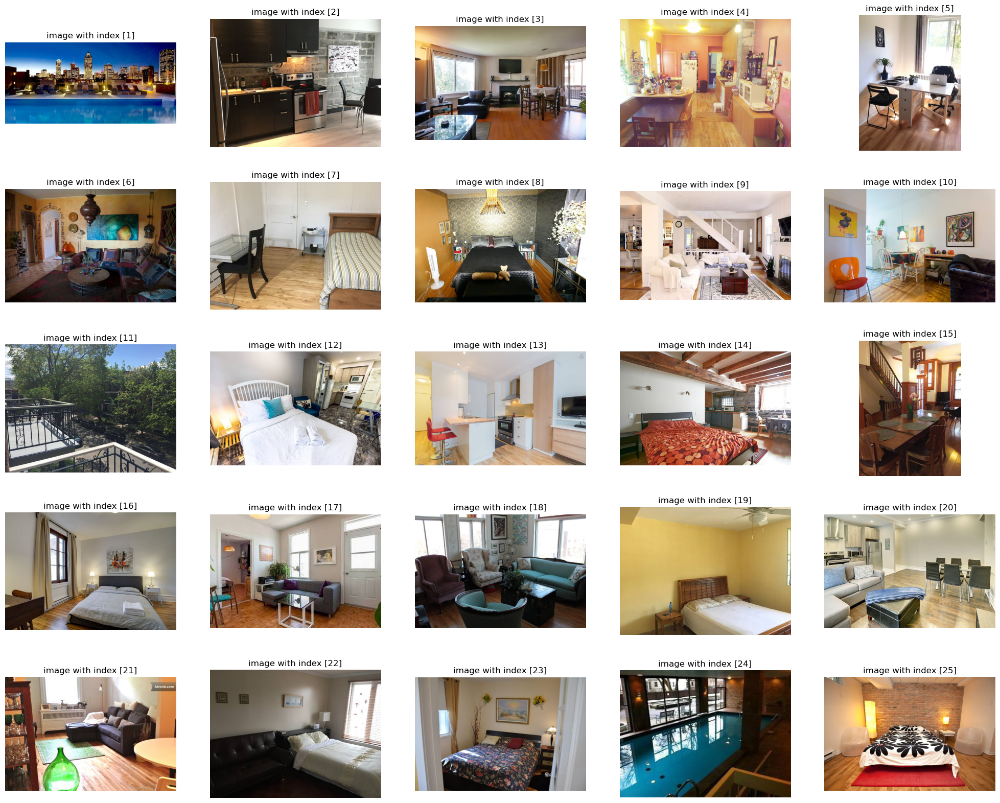

In [25]:
Explore.display_images('image')

Text(0.5, 1.0, 'Spacious, sunny and cozy modern apartment in the heart of Montreal. This 3 bedroom centrally located in the very popular Plateau Mont-royal neighborhood in the middle of prince-arthur pedestrian-only street. Close to all amenities ( Restaurants, coffee house, bars, clubs, shopping, universities, subway stations). Experience Montreal like a real local resident, be in the heart of the action: grand prix week, grill Saint-Laurent festival, mural 2019 and so much more!')

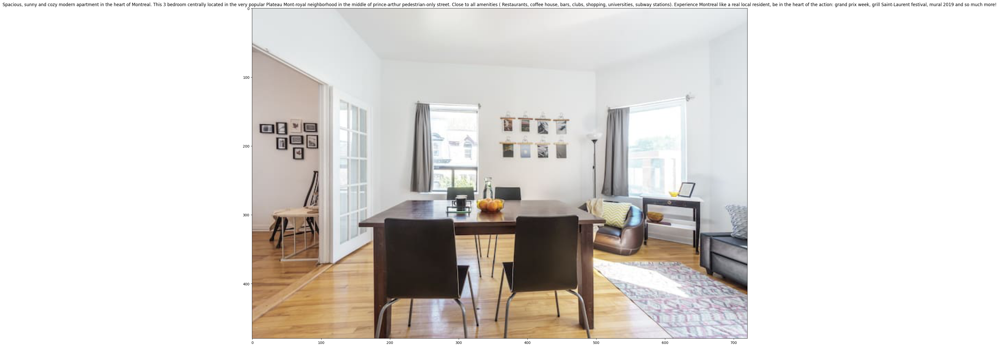

In [ ]:
# plot image and its summary
plt.figure(figsize=(25,20))
img = mpimg.imread(data['image'][0])
imgplot = plt.imshow(img)
plt.title(data['summary'][0])


(480, 1010, 3)


Text(0.5, 1.0, 'Located in one of the most vibrant and accessible locations of downtown Montreal, this one bedroom condo will not only impress you but leave you with one of the most memorable experiences. It is walking distance of the popular Sainte-Catherine Street, the Bell Center, the Old Port, Lachine Canal, Bonaventure metro, and much much more...')

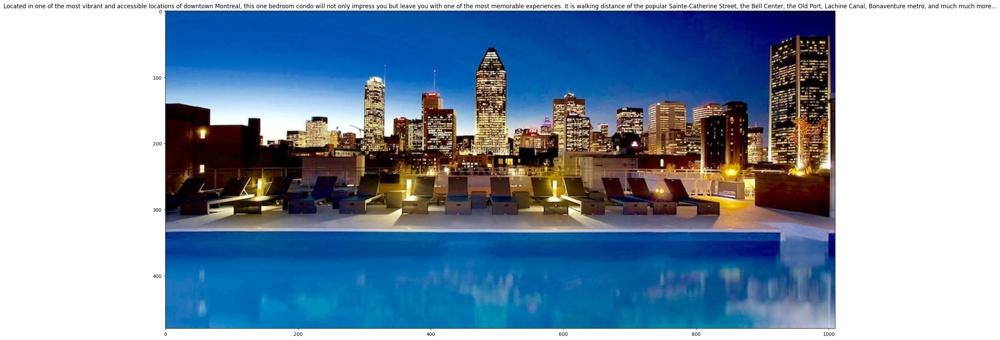

In [ ]:
plt.figure(figsize=(25,20))

img = mpimg.imread(data['image'][1])
imgplot = plt.imshow(img)
print(img.shape)
plt.title(data['summary'][1])


**Observation**

- It looks like we'll need to resize the images to form tensor minibatches appropriate for training a model
- As you can see the images is for different parts in apartement or coCondominium or house  


### Count words in each row
-------------------
----------------

In [32]:
Explore.count_word()

Describe count of words 

__________________________________________________

count    7326.000000

mean       58.002457

std        23.267883

min         1.000000

25%        40.000000

50%        61.000000

75%        78.000000

max       177.000000

Name: summary, dtype: float64


,count_word
0,70.0
1,55.0
2,28.0
3,94.0
4,88.0
...,...
7622,57.0
7623,41.0
7624,53.0
7625,31.0


**Observations**

- As we may have expected, the summary text isn't usually too long.
- The longest text have only  177 words.

### Display sample of text 
---------------------
--------------

In [7]:
data['summary'].head()

0    Spacious, sunny and cozy modern apartment in t...
1    Located in one of the most vibrant and accessi...
2    Logement coquet et douillet à 10 minutes du ce...
3    Beautiful and spacious (1076 sc ft, / 100 mc) ...
4    Très grand appartement ''rustique'' et très ag...
Name: summary, dtype: object

In [8]:
data['summary'].tail()

7622    Un grand logement 4 et 1/2, tout inclut, bien ...
7623    Magnificent condo directly on the river. You w...
7624    This apartment is perfect for anyone visiting ...
7625    It is a cozy ,clean ,and comfortable apartment...
7626    Modern country style (newly-renovated); open c...
Name: summary, dtype: object

**Observation**

- As you can see, There is some foreign language. The data contains text with different languages. Don't worry, we will handle this problem in the next section

### Check Null values
----------
------------

,null_val,percent_
summary,301,4.0
image,0,0.0
type,0,0.0
price,0,0.0


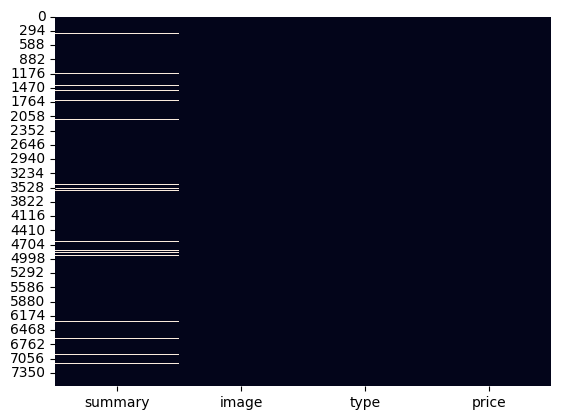

In [ ]:
Explore.null_values()

**Observations**

- There are null values only in summary column 
- The null values doesn't represent large percet.So, we decided to drop these rows as we will see in the next section

### Check duplicated rows
---------------
---------------

In [ ]:
Explore.duplicated_values()

Number of duplicated rows 0


**Observation**

- Thanks to Allah, there is no duplication 

### Check Cardinality
-------------
----------

In [ ]:
Explore.cardinality()

,unique_val,percent_
image,7627,100.0
summary,6845,90.0
type,24,0.0
price,3,0.0


**Observation**

- As we mentioned before, all samples im image column are unique
- There is about 10% of samples in summary are duplicated
- Also, there is no duplications rows 
- According to previous observation, we can conclude that we can express more than image with the same summary .However, the images are different but have the same summary. So, we expect that we cann't depend totally on the text without image. Image provides addition information to text.

### Check Imbalance classes
-----------------
---------------

0    0.621083



1    0.315065



2    0.063852



Name: price, dtype: float64


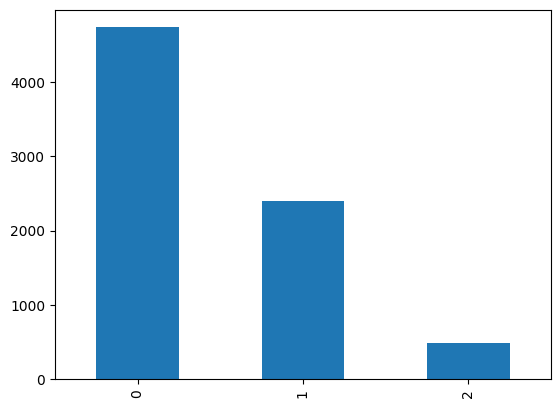

In [ ]:
Explore.imbalance('price')

**Observation**

- Class 0 has high count compared to other classes
- our data is imbalanced and we expected that our model will be baised towards class 0 .So, we will try to deal with this problem in the next stage

Apartment                 0.755867

Condominium               0.090599

House                     0.053232

Loft                      0.042481

Townhouse                 0.021896

Serviced apartment        0.010096

Bed and breakfast         0.004982

Guest suite               0.004196

Hostel                    0.003409

Bungalow                  0.003278

Guesthouse                0.001836

Cottage                   0.001573

Aparthotel                0.001573

Boutique hotel            0.001311

Other                     0.001049

Villa                     0.000918

Tiny house                0.000393

Boat                      0.000262

Cabin                     0.000262

Camper/RV                 0.000262

Casa particular (Cuba)    0.000131

Hotel                     0.000131

Earth house               0.000131

Castle                    0.000131

Name: type, dtype: float64


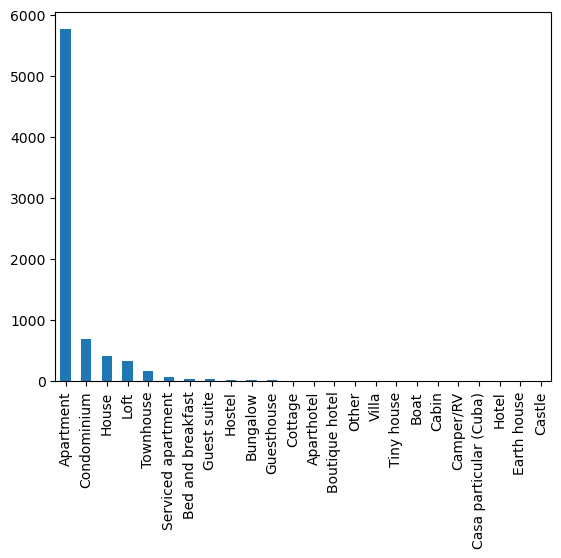

In [ ]:
Explore.imbalance('type')

**Observations**

- Apartment is the most dominant category in the type column 
- There is a large imbalance in this column. we expect that our model will suffer from overfitting and bais towards class Apartment.we will try to handel this problem later 
- This column is string. Machine doesn't know how to deal with string. So, we will encode this column.

# Data Preprocessing
----------------------
---------------------

### Drop Null Values 
-----------------
--------------------

In [33]:
data = Explore.drop_col()

In [34]:
print("Shape of data after droping rows that contain null vales " ,data.shape)

(7326, 4)

**Observation**

- As we mentioned before, there are null values in summary column. Here, we dropped these rows from all column to improve the performance

### Text Preprocessing
--------------
----------------

- Translate summary column
- Tokenize text and convert it to sequence of integer values

In [15]:
#simple function to detect and translate text 
def detect_and_translate(text):
  try:
    result_lang = detect(text)

    if result_lang == 'en':
      return text 

    else:
      translator = GoogleTranslator(source='auto', target='en')
      translate_text = translator.translate(text)
      return translate_text 
  except:
    return text 

def _preprocess(list_of_text):
    return pad_sequences(tokenizer.texts_to_sequences(list_of_text),maxlen=max_len,padding='post',)




In [ ]:
data.summary = data.summary.astype('str')

data['translated_summary'] = data['summary'].apply( detect_and_translate)


In [ ]:
submission_data['translated_summary'] = submission_data['summary'].apply( detect_and_translate)

In [ ]:
data = data.to_csv('data_translated.csv', index=False)
submission_data = submission_data.to_csv('submission_data_translated.csv', index=False)


----------------------------
----------------------
----------------------------
-----------------------

In [16]:

vocab_size = 40000
max_len = 177

# build vocabulary from training set
tokenizer = Tokenizer(num_words=vocab_size)
tokenizer.fit_on_texts(data['translated_summary'])

# # padding is done inside: 
x_train_text_id = _preprocess(data['translated_summary'])

print( tokenizer.sequences_to_texts(x_train_text_id[:1]))
print(x_train_text_id[0])


['spacious sunny and cozy modern apartment in the heart of montreal this 3 bedroom centrally located in the very popular plateau mont royal neighborhood in the middle of prince arthur pedestrian only street close to all amenities restaurants coffee house bars clubs shopping universities subway stations experience montreal like a real local resident be in the heart of the action grand prix week grill saint laurent festival mural 2019 and so much more']
[  95  224    2   91  119   10    5    1   28    6   13   23   78   34
  602   15    5    1   27  556   48   50   35   90    5    1  585    6
 1040 1041  824  143   26   25    4   24  154   21  137  134   53  406
  140  614  126  218  235   13  212    3  703  279 2550   72    5    1
   28    6    1  530  969 1236  892 2116  156  188  603 1845 1479    2
  191  410  158    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0  

### Image Preprocessing 
------
------------


In [17]:
# In 'LA' mode, 'L' stands for Luminance (8-bit pixels, black and white) and 'A' stands for Alpha. The value of alpha in 'LA' mode can range from 0 to 255.
# So when you convert an image to 'LA' mode using convert(), you’re converting it to black and white with an alpha channel.
# In digital images, each pixel contains color information (such as values describing intensity of red, green, and blue) and also contains a value for its opacity known as its ‘alpha’ value1. An alpha value of 1 means totally opaque, and an alpha value of 0 means totally transparent1.
# Opacity refers to the degree to which something is transparent or opaque. In digital images, opacity is represented by an alpha channel. An alpha value of 1 means totally opaque, and an alpha value of 0 means totally transparent.

def Resize_image(filepath):
    try:
    # Convert to 'LA' mode and resize image to 128 x 128
        image = Image.open(filepath).convert('LA').resize((128,128))
        arr = np.array(image)

    except:
        print(filepath)
        arr = np.zeros((128, 128, 2))
    return arr
#resize trained images
x_train_image = np.array([Resize_image(i) for i in data.image])


C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-873-dm-w23-a4\a4\img_train/4176.jpg
C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-873-dm-w23-a4\a4\img_train/6083.jpg


Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)

Shape of image  (7326, 128, 128, 2)


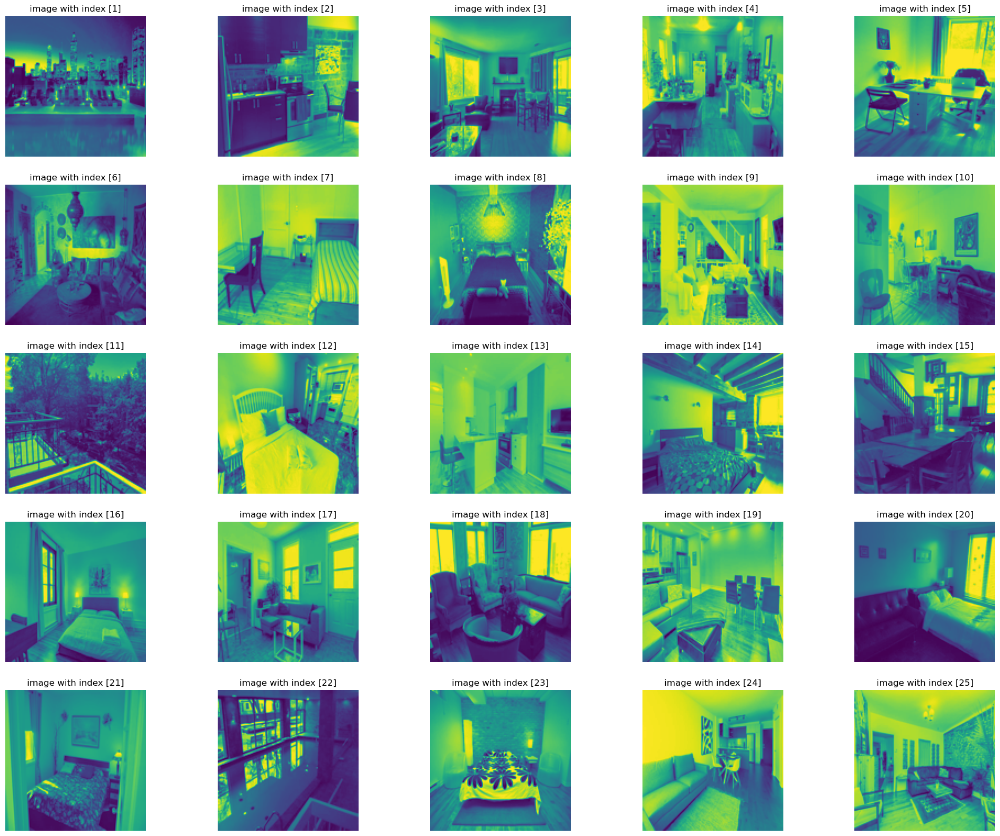

In [52]:
# display the images after resizing
Explore_Data(data).display_images('image_arr',image=False , img  = x_train_image )

In [53]:
data.tail()

,summary,image,type,price,translated_summary
7321,"Un grand logement 4 et 1/2, tout inclut, bien ...",C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-8...,Apartment,0,"A large 4 and 1/2 apartment, all inclusive, we..."
7322,Magnificent condo directly on the river. You w...,C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-8...,Apartment,2,Magnificent condo directly on the river. You w...
7323,This apartment is perfect for anyone visiting ...,C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-8...,Apartment,1,This apartment is perfect for anyone visiting ...
7324,"It is a cozy ,clean ,and comfortable apartment...",C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-8...,Apartment,0,"It is a cozy ,clean ,and comfortable apartment..."
7325,Modern country style (newly-renovated); open c...,C:\Users\LAB\Videos\flash_new_1\copy-of-cisc-8...,House,1,Modern country style (newly-renovated); open c...


### Encode Labels

In [9]:
# labels:
data['type'] = data.type.astype('category').cat.codes
len_type = len(data.type.unique())
len_price = len(data.price.unique())
print("Number of categories in type column " , len_type  )
print("Number of categories in price column" , len_price)

Number of categories in type column  24
Number of categories in price column 3


1     0.755867
10    0.090599
17    0.053232
18    0.042481
22    0.021896
20    0.010096
2     0.004982
13    0.004196
15    0.003409
5     0.003278
14    0.001836
11    0.001573
0     0.001573
4     0.001311
19    0.001049
23    0.000918
21    0.000393
3     0.000262
6     0.000262
7     0.000262
8     0.000131
16    0.000131
12    0.000131
9     0.000131
Name: type, dtype: float64


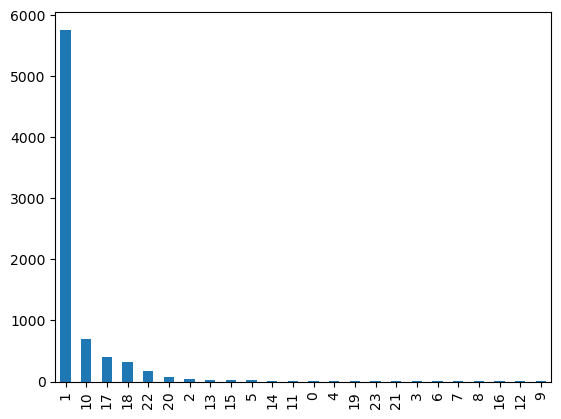

In [10]:
Explore.imbalance('type')

**Observation**
- As you can see, we sucessfully convert encode categories into 0 ,1 2 ,....

# Applying  Preprocess steps on text data
-------------------
-------------------


In [7]:
x_test_image = np.array([Resize_image(i) for i in submission_data['image']])  
submission_data.summary = submission_data.summary.astype('str')
x_test_text = _preprocess(submission_data['translated_summary'].astype('str'))# load and resize the images from the test set

# Initialize
---------------------
-----------------

In [2]:
# here we have two inputs. one for image and the other for text.
x_train_text_id = np.array(x_train_text_id, dtype = 'float32')
in_text = keras.Input(batch_shape=(None, max_len))
in_image = keras.Input(batch_shape=(None,128,128, 2))
checkpoint_filepath = '/tmp/checkpoint'

# Build Model
------------
-------------

In [18]:
#--------------------------------------- Multimodality model ^_^ ----------------------------------------------

'''
This Function helps us build multi modality model through combining text and image features. Then pass them to output dense layer with softmax activation function
After building model, we complie it with optimizer, loss values for each task, and loss_weights for each task. This function gives us
options our loss function and loss_weights for each class. It's a very powerful way to try more trails without repeat code

we try Focal Loss which is, by design, a better choice for a loss function when dealing with imbalanced classification datasets.
'''

def build_model(averaged , flattened , price_weight , type_weight , weights_focal = False):
  # fusion - combinig both
  fused = tf.concat([averaged, flattened], axis=-1)

  # multi-task learning (each is a multi-class classification)
  # one dense layer for each task
  p_price = Dense(len_price, activation='softmax', name='price')(fused)
  p_type = Dense(len_type, activation='softmax', name='type')(fused)


  # define model input/output using keys.
  model = keras.Model(
      inputs={
          'summary': in_text,
          'image': in_image
      },
      outputs={
          'price': p_price,
          'type': p_type,
      },
  )

  if weights_focal :
   
    model.compile(
        optimizer=Adam(),
        loss={
            'price': SparseCategoricalFocalLoss(gamma=2),
            'type': SparseCategoricalFocalLoss(gamma=2),
        },
        loss_weights={
            'price': price_weight,
            'type': type_weight,       
        },
        metrics={
            'price': ['SparseCategoricalAccuracy'],
            'type': ['SparseCategoricalAccuracy'],
        },
    )
  else:
       model.compile(
        optimizer=Adam(),
        loss={
            'price': 'sparse_categorical_crossentropy',
            'type': 'sparse_categorical_crossentropy',
        },
        loss_weights={
            'price': price_weight,
            'type': type_weight,       
        },
        metrics={
            'price': ['SparseCategoricalAccuracy'],
            'type': ['SparseCategoricalAccuracy'],
        },
    )


  model.summary()
  return model

#---------------------------------------  model one Input ^_^ ----------------------------------------------

'''
This Function is same as above one but this time we pass only one feature from 2 features (text and image).We built this function t
to see the performance in each case and compare it with the multi modality model
'''
def build_model_one_input(model_structure , input_feature ,  price_weight , type_weight , weights_focal = False):
    
  p_price = Dense(len_price, activation='softmax', name='price')(model_structure)
  p_type = Dense(len_type, activation='softmax', name='type')(model_structure)


  # define model input/output using keys.
  model = keras.Model(
      inputs=input_feature , 
      outputs={
          'price': p_price,
          'type': p_type,
      },
  )

  if weights_focal :
    model.compile(
        optimizer=Adam(),
        loss={
            'price': SparseCategoricalFocalLoss(gamma=2), 
            'type': SparseCategoricalFocalLoss(gamma=2),
        },
        loss_weights={
            'price': price_weight,
            'type': type_weight,       
        },
        metrics={
            'price': ['SparseCategoricalAccuracy'],
            'type': ['SparseCategoricalAccuracy'],
        },
    )
  else:
       model.compile(
        optimizer=Adam(),
        loss={
            'price': 'sparse_categorical_crossentropy',
            'type': 'sparse_categorical_crossentropy',
        },
        loss_weights={
            'price': price_weight,
            'type': type_weight,       
        },
        metrics={
            'price': ['SparseCategoricalAccuracy'],
            'type': ['SparseCategoricalAccuracy'],
        },
    )


  model.summary()
  return model


# Image model

In [19]:
#---------------------------------------  Image Part ^_^ ----------------------------------------------

'''
This Function build convolution layers to extract features from images.
Through this Function, we can specify dropout layers and convolution layers.
if you want to add more convolution layers, pass true to an argument conv2d.
if you want to add dropout layer followed each convolution layer, pass true to an argument drop. 
if you want to add dropout and convolution layer, pass true to both arguments  

Then we pass the return of this function to build_model or build_model_one_input Function
'''
def image_model(conv2d =False ,drop = False):
    cov = Conv2D(64, (5, 5), activation='relu')(in_image)
    if drop:
        cov = Dropout(.2)(cov)
    pl = MaxPool2D((2, 2))(cov)
    if conv2d :
        cov1 = Conv2D(64, (7, 7), activation='relu')(pl)
        if drop:
            cov1 = Dropout(.4)(cov1)
        pl = MaxPool2D((2, 2))(cov1)
    cov2 = Conv2D(32, (16, 16), activation='relu')(pl)
    if drop:
        cov2 = Dropout(.4)(cov2)
    pl2 = MaxPool2D((2, 2))(cov2)
    flattened = Flatten()(pl2)
    return flattened


# Text Model

In [20]:
#---------------------------------------  Text Part ^_^ ----------------------------------------------

'''
This Function can build different type of models such lstm or gru or bidirectional lstm or just 
applying embedding in the text to extract features from the text.
Through this Function, we can specify type of model we need.
if you want to apply lstm, pass a word of 'lstm'.
if you want to apply gru, pass a word of 'gru'.
if you want to apply bidirectional lstm, pass a word of 'bidirect'.
if you want to apply embbeding only, pass any word other than the previous words.
'''

def text_model(type_model):
    embedded = keras.layers.Embedding(tokenizer.num_words, 177)(in_text)
    if type_model == 'lstm':
        text_model_ = tf.keras.layers.LSTM(16)(embedded)
    elif type_model == 'gru':
        text_model_ =tf.keras.layers.GRU(7)(embedded)
    elif type_model == 'bidirect':
        text_model_ =  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(5))(embedded)
    else:
        # simple average of embedding
        text_model_ = tf.reduce_mean(embedded, axis=1)
        
    return text_model_

# Train Model

In [21]:
#---------------------------------------  Train Multi Modality Model ^_^ ----------------------------------------------

'''
This Function takes the model we built already from the previous fuction and train it. we specify some of hyperparamters 
through try and error way to tune them to improve the performance
'''


def fit_model(model ):
  
  model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath, monitor='val_accuracy',mode='max',save_best_only=True)
  history = model.fit(
    x={
        'summary': x_train_text_id,
        'image':  x_train_image
    },
    y={
        'price': tf.convert_to_tensor(data.price),
        'type': tf.convert_to_tensor(data.type),
    },
    epochs=50,
    batch_size=200,
    validation_split=0.2,
    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_price_loss', patience=5 ) , model_checkpoint_callback],
    workers = -1 ,
    use_multiprocessing =True,
    verbose=1)
  return history ,model

#---------------------------------------  Train mono Model ^_^ ----------------------------------------------

'''
This Function has the same functionality of the above function but the only difference that it deals with model with single input 

'''

def fit_model_one_input(model  , input_features):
  
  model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath, monitor='val_accuracy',mode='max',save_best_only=True)
  history = model.fit(
    x=input_features,
    y={
        'price': tf.convert_to_tensor(data.price),
        'type': tf.convert_to_tensor(data.type),
    },
    epochs=50,
    batch_size=200,
    validation_split=0.2,
    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_price_loss', patience=5 ) , model_checkpoint_callback],
    workers = -1 ,
    use_multiprocessing =True,
    verbose=1)
  return history ,model


# Visualize 

In [22]:
#---------------------------------------  Visulaization ^_^ ----------------------------------------------
'''
This Function plot a nice 2 graphs : one for loss and the other for accuracy.
'''

def plot_loss_accuracy_curves(history):
    # first we display the training price accuracy vs. the validation price accuracy
    plt.plot(history.history['price_sparse_categorical_accuracy'])
    plt.plot(history.history['val_price_sparse_categorical_accuracy'])
    plt.legend(['accuracy', 'val_accuracy'], loc='upper left')
    plt.show() # display the figure
    print("____"*50)
    # first we display the training price loss vs. the validation price loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.legend(['loss', 'val_loss'], loc='upper left')
    plt.show() # display the figure
    

In [23]:
#---------------------------------------  Save Csv submitted file of multimodality model ^_^ ----------------------------------------------
'''
This Function takes the trained model and applies the multi modality model on the test data. these prediction is saved into csv file to submit it
''' 

def Submission(model , model_name):
    
    # we can do prediction on training set
    y_predict = model.predict(
        {
            'summary': x_test_text,
            'image': x_test_image
        }
                              )

    # probabilities
    price_predicted = y_predict['price']
    print("probabilities of predicted price" )  
    print( price_predicted)# probability the sample belongs to each of the categories
    print("__"*50)
    # categories
    price_category_predicted = np.argmax(price_predicted, axis=1)  # pick the highest value, and assign it as the predicted class
    print("values of of predicted price :" )                                # print the categorical predictions, which are in [0,1,2]
    print(price_category_predicted)

    # create the submission dataframe/csv for submissionpd.
    submitted_file = pd.DataFrame({'id': submission_data.id,'price': price_category_predicted})
    print("counts of classes predicted in submitted file")
    print(submitted_file.value_counts)
    submitted_file.to_csv('submission_{}.csv'.format(model_name), index=False)

    
#---------------------------------------  Save Csv submitted file of mono model ^_^ ----------------------------------------------
'''
This Function has the same functionality of the above function but the only difference that it deals with model with single input 
''' 

    
def submission_one_input(model , model_name , feature_input):
    
    y_predict = model.predict(feature_input)
      
    # probabilities
    price_predicted = y_predict['price']
    print("probabilities of predicted price" )  
    print( price_predicted)# probability the sample belongs to each of the categories
    print("__"*50)
    # categories
    price_category_predicted = np.argmax(price_predicted, axis=1)  # pick the highest value, and assign it as the predicted class
    print("values of of predicted price :" )                                # print the categorical predictions, which are in [0,1,2]
    print(price_category_predicted)

    # create the submission dataframe/csv for submissionpd.
    submitted_file = pd.DataFrame({'id': submission_data.id,'price': price_category_predicted})
    print("counts of classes predicted in submitted file")
    print(submitted_file.value_counts)
    submitted_file.to_csv('submission_{}.csv'.format(model_name), index=False)
    

In [24]:
#------------------------- Save Model ^_^ ------------------------------------
def model_save(model , model_name):
    save_model(model, "model{}.h5".format(model_name))

# 1st trail (MultiModality Model )
---------------
---------------

In this trail, I prefered to starting with building multimodality model. As we mentioned before, we expect that 2 features together( text , image) will give us high performance.

In this trail, we handled:
- Text part:
    - We used Embedding layer enables us to convert each word into a fixed length vector of defined size. The resultant vector is a dense one with having real values instead of just 0's and 1's. The fixed length of word vectors helps us to represent words in a better way along with reduced dimensions.

    - Then we used averaged layer to compute the mean of the embeddings to reduce the rank of the embedding.

- Image part:
    - we used convolutional neural network layer with 64 filters, and a 5x5 mask, no padding , one stride with relu as activation function .

    - Then we used max pooling layer with a 2x2 mask,it reduced the size to 62x62x64
    
    - Followed by another convolutional neural network layer with 32 filters, and a 16x16 mask, no padding , one stride .
    
    - Then we used max pooling layer with a 2x2 mask,it reduced the size to 23x23x32
    
    - After that, we used flatten layer to flatten the multi-dimensional input tensors into a single dimension that it was (16928,).
    
- Imbalance in price column :
  - we try Focal Loss which is, by design, a better choice for a loss function when dealing with imbalanced classification datasets.



In [28]:
averaged_1st_trail = text_model('embedding')
flattened_1st_trail = image_model()
model_1st_trail = build_model(averaged_1st_trail , flattened_1st_trail , 1 , 0 , weights_focal = True)
history_model_1st_trail , model_1st_trail = fit_model(model_1st_trail)


Model: "model_1"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_2 (InputLayer)           [(None, 128, 128, 2  0           []                               

                                )]                                                                

                                                                                                  

 conv2d_2 (Conv2D)              (None, 124, 124, 64  3264        ['input_2[0][0]']                

                                )                                                                 

                                                                                                  

 max_pooling2d_2 (MaxPooling2D)  (None, 62, 62, 64)  0           ['conv2d_2[0][0]']               

                                                                                 

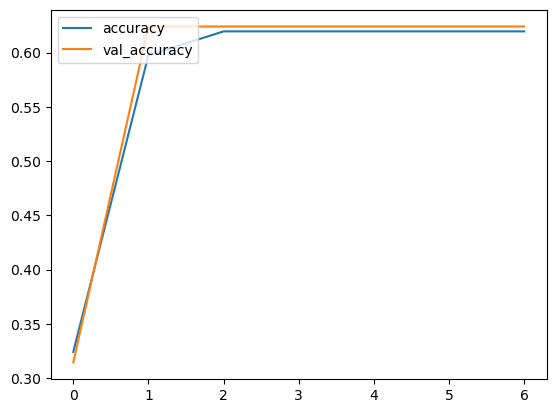

________________________________________________________________________________________________________________________________________________________________________________________________________


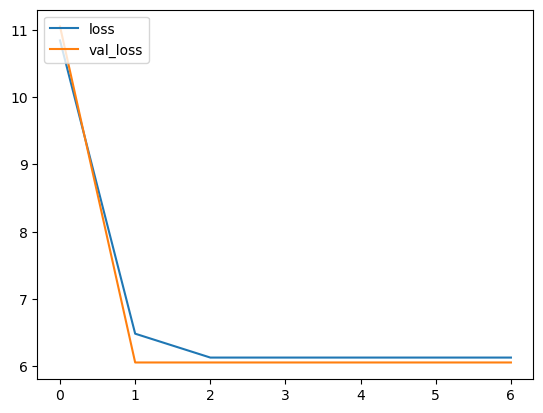

In [30]:
plot_loss_accuracy_curves(history_model_1st_trail)

**Observation**

- From the above plots and training verbose, we can noticed that the model is quit good.
- The accuracy isn't good.It is only  0.6241 % 
- The good thing in this model that there is no overfittig. The accuracy in train and test data are almost the same 
- So, we expect that the accuracy in kaggle will be the same
- Focal loss and early stopping have a good impact in preventing overfitting

In [31]:
Submission(model_1st_trail , "1st_trail")
model_save(model_1st_trail , "1st_trail")

230/230 [==============================] - 63s 273ms/step

probabilities of predicted price

[[0.99999994 0.         0.        ]

 [0.99999994 0.         0.        ]

 [0.99999994 0.         0.        ]

 ...

 [0.99999994 0.         0.        ]

 [0.99999994 0.         0.        ]

 [0.99999994 0.         0.        ]]

____________________________________________________________________________________________________

values of of predicted price :

[0 0 0 ... 0 0 0]

counts of classes predicted in submitted file

<bound method DataFrame.value_counts of         id  price

0        0      0

1        1      0

2        2      0

3        3      0

4        4      0

...    ...    ...

7355  7626      0

7356  7627      0

7357  7628      0

7358  7629      0

7359  7630      0



[7360 rows x 2 columns]>


**Observation**

- Score in Kaggle :  0.62038 % (as we expected)

Let's try to improve thsis

In [32]:
#clear session
tf.keras.backend.clear_session()

# 2nd trail (MultiModality Model  single objective)
-------------
-------------

In this trail, we will use the same model of the previous trail but this time, we will change the loss function to see if this will improve the performance.

Acutually, I expect that there will be an overfitting in the model. but I want to see the behaviour of this model in kaggle.

In this trail, we handled:
- Text part:
    - We used Embedding layer enables us to convert each word into a fixed length vector of defined size. The resultant vector is a dense one with having real values instead of just 0's and 1's. The fixed length of word vectors helps us to represent words in a better way along with reduced dimensions.

    - Then we used averaged layer to compute the mean of the embeddings to reduce the rank of the embedding.

- Image part:
    - we used convolutional neural network layer with 64 filters, and a 5x5 mask, no padding , one stride with relu as activation function .

    - Then we used max pooling layer with a 2x2 mask,it reduced the size to 62x62x64
    
    - Followed by another convolutional neural network layer with 32 filters, and a 16x16 mask, no padding , one stride .
    
    - Then we used max pooling layer with a 2x2 mask,it reduced the size to 23x23x32
    
    - After that, we used flatten layer to flatten the multi-dimensional input tensors into a single dimension that it was (16928,).

In [33]:
averaged_2nd_trail = text_model('embedding')
flattened_2nd_trail = image_model()
model_2dn_trail = build_model(averaged_2nd_trail , flattened_2nd_trail , 1 , 0 , weights_focal = False)
history_model_2nd_trail , model_2nd_trail = fit_model(model_2dn_trail)

Model: "model"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_2 (InputLayer)           [(None, 128, 128, 2  0           []                               

                                )]                                                                

                                                                                                  

 conv2d (Conv2D)                (None, 124, 124, 64  3264        ['input_2[0][0]']                

                                )                                                                 

                                                                                                  

 max_pooling2d (MaxPooling2D)   (None, 62, 62, 64)   0           ['conv2d[0][0]']                 

                                                                                   

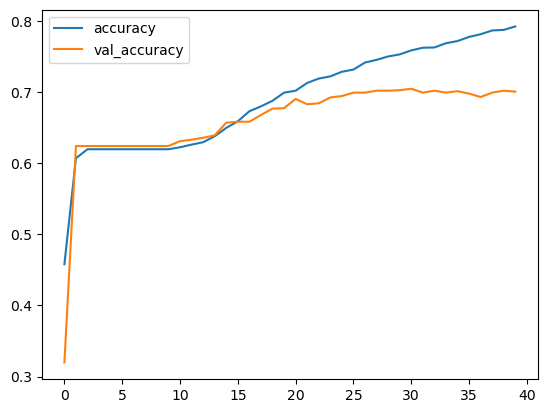

________________________________________________________________________________________________________________________________________________________________________________________________________


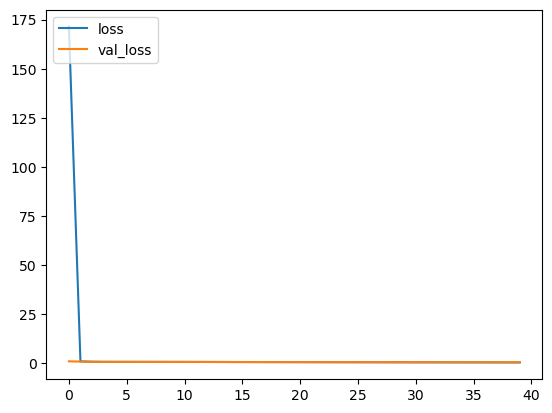

In [34]:
plot_loss_accuracy_curves(history_model_2nd_trail)

**Observation**

- From the above plots and training verbose, we can noticed that the model doesn't perform well on validation data.
- This is a significant overfitting in this model as we expected
- The accuracy in validation data isn't good.It is only  70 % (higher than ther previous trail)
- The difference between accuracy in train(80%) and validation (70%) is large 
- So, we expect that the model will give us low score in kaggle
- Focal loss had a good impact in preventing overfitting. As you see after removing it the overfitting increased

In [35]:
Submission(model_2nd_trail , "2nd_trail")
model_save(model_2nd_trail , "2nd_trail")

230/230 [==============================] - 65s 282ms/step

probabilities of predicted price

[[0.82867235 0.14869116 0.02263645]

 [0.88663894 0.09319116 0.02016987]

 [0.8862957  0.09220586 0.02149838]

 ...

 [0.8225065  0.15670532 0.02078809]

 [0.98772705 0.01009632 0.00217664]

 [0.77818334 0.195048   0.02676866]]

____________________________________________________________________________________________________

values of of predicted price :

[0 0 0 ... 0 0 0]

counts of classes predicted in submitted file

<bound method DataFrame.value_counts of         id  price

0        0      0

1        1      0

2        2      0

3        3      0

4        4      0

...    ...    ...

7355  7626      1

7356  7627      0

7357  7628      0

7358  7629      0

7359  7630      0



[7360 rows x 2 columns]>


**Observation**

- Score in kaggle : 0.68559 % (Surprisely, the accuracy is improved than the previous trail)
- Although we found the overfitting in the model but it achived high score compared to the previous trail
- Focal loss avoid overfitting but it doesn't improve the accuracy.
- we will try another method to reduce overfitting
Let's try to improve this model and reduce the overfitting

In [36]:
#clear session
tf.keras.backend.clear_session()

# 3nd Trail (MultiModality Model single objective)

In this trail, we will 
- text part :
    - replace the reduce_mean layer with an LSTM layer for te and vary the number of units to handele text as LSTMs are able to selectively remember patterns for long durations of time which makes them more effective in certain applications.
So, the model will be able to find out the actual meaning in input string and will give the most accurate output class. 
- Image part:
    - increase convolution layers and dropout layer to reduce overfiting

we expect that this changes will improve the performance
        
In this trail, we handled:

- Text part:

    - We used Embedding layer enables us to convert each word into a fixed length vector of defined size. The resultant vector is a dense one with having real values instead of just 0's and 1's. The fixed length of word vectors helps us to represent words in a better way along with reduced dimensions.

    - Then we used an LSTM layer and vary the number of units (16)

- Image part:

- we used convolutional neural network layer with 64 filters, and a 5x5 mask, no padding , one stride with relu as activation function .
- Followed by dropout layer 
- Then we used max pooling layer with a 2x2 mask,it reduced the size to 62x62x64

- Followed by another convolutional neural network layer with 64 filters, and a 7x7 mask, no padding , one stride and drop out layer follow it .

- Then we used max pooling layer with a 2x2 mask,it reduced the size to 28x28x64
- Another convolutional neural network layer ,dropout and maxpooling layer

- After that, we used flatten layer to flatten the multi-dimensional input tensors into a single dimension that it was (1152, ).

In [39]:
averaged_3_1rd_trail = text_model('lstm')
flattened_3_1rd_trail = image_model(conv2d =True ,drop = True)
model_3_1rd_trail = build_model(averaged_3_1rd_trail , flattened_3_1rd_trail , 1 , 0 , weights_focal = False)
history_model_3_1rd_trail , model_3_1rd_trail = fit_model(model_3_1rd_trail)

Model: "model"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_2 (InputLayer)           [(None, 128, 128, 2  0           []                               

                                )]                                                                

                                                                                                  

 conv2d_1 (Conv2D)              (None, 124, 124, 64  3264        ['input_2[0][0]']                

                                )                                                                 

                                                                                                  

 dropout (Dropout)              (None, 124, 124, 64  0           ['conv2d_1[0][0]']               

                                )                                                  

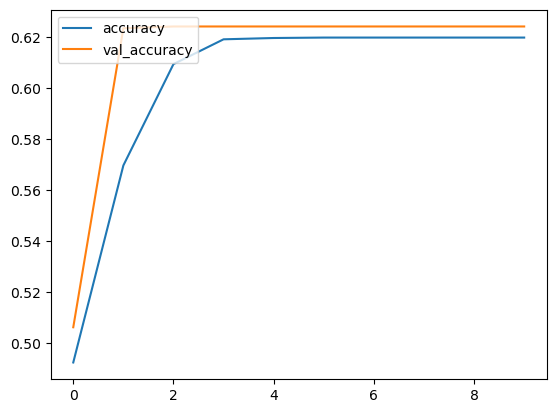

________________________________________________________________________________________________________________________________________________________________________________________________________


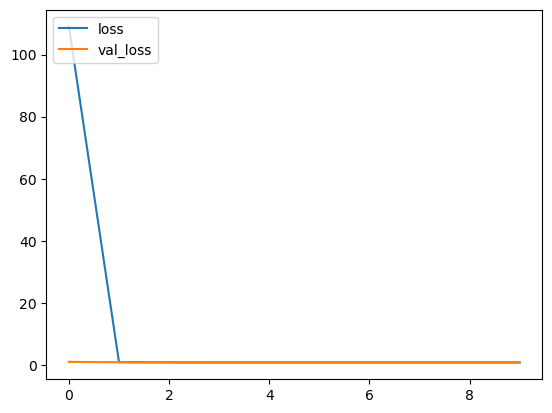

In [40]:
plot_loss_accuracy_curves(history_model_3_1rd_trail)

**Observation**

- From the above plots and training verbose, we can noticed that the model is quit good.
- The accuracy isn't good.It is only  0.6241 % 
- The good thing in this model that there is no overfittig. The accuracy in train and test data are almost the same 
- So, we expect that the accuracy in kaggle will be the same
- Dropout and early stopping have a good impact in preventing overfitting
- There is no improvement in accuracy.This trail is similar as the 1st trail
- we expect that this trail will achieve the same score as the 1st trail


In [41]:
Submission(model_3_1rd_trail , "3_1rd_trail")
model_save(model_3_1rd_trail , "3_1rd_trail")

230/230 [==============================] - 37s 161ms/step

probabilities of predicted price

[[0.61192906 0.30847278 0.07959815]

 [0.611068   0.30770263 0.08122937]

 [0.611068   0.30770263 0.08122937]

 ...

 [0.61131084 0.3078012  0.080888  ]

 [0.61293405 0.3070181  0.08004776]

 [0.61101705 0.3079689  0.0810141 ]]

____________________________________________________________________________________________________

values of of predicted price :

[0 0 0 ... 0 0 0]

counts of classes predicted in submitted file

<bound method DataFrame.value_counts of         id  price

0        0      0

1        1      0

2        2      0

3        3      0

4        4      0

...    ...    ...

7355  7626      0

7356  7627      0

7357  7628      0

7358  7629      0

7359  7630      0



[7360 rows x 2 columns]>


**Observation**

- Score in kaggle : 0.62038 % (The score exactly as the first trail as we expected)



In [42]:
#clear session
tf.keras.backend.clear_session()

# 4rd trail
----------------------
-------------------

In this trail, we will 
- text part :
    - Use the same architecture for the text as the previuos trail
- Image part:
    - Use the same architecture as the 2nd trail. But this time add dropout layer to reduce overfiting
we expect that this changes will improve the performance
        
In this trail, we handled:

- Text part:

    - We used Embedding layer enables us to convert each word into a fixed length vector of defined size. The resultant vector is a dense one with having real values instead of just 0's and 1's. The fixed length of word vectors helps us to represent words in a better way along with reduced dimensions.

    - Then we used an LSTM layer and vary the number of units (16)

- Image part:

- we used convolutional neural network layer with 64 filters, and a 5x5 mask, no padding , one stride with relu as activation function .
- Followed by dropout layer 
- Then we used max pooling layer with a 2x2 mask,it reduced the size to 62x62x64

- Followed by another convolutional neural network layer with 32 filters, and a 7x7 mask, no padding , one stride and drop out layer follow it .

- Then we used max pooling layer with a 2x2 mask,it reduced the size to 23x23x32


- After that, we used flatten layer to flatten the multi-dimensional input tensors into a single dimension that it was ( 16928,).

In [47]:
averaged_3rd_trail = text_model('lstm')
flattened_3rd_trail = image_model(drop = True)
model_3rd_trail = build_model(averaged_3rd_trail , flattened_3rd_trail , 1 , 0 , weights_focal = False)
history_model_3rd_trail , model_3rd_trail = fit_model(model_3rd_trail)

Model: "model"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_2 (InputLayer)           [(None, 128, 128, 2  0           []                               

                                )]                                                                

                                                                                                  

 conv2d (Conv2D)                (None, 124, 124, 64  3264        ['input_2[0][0]']                

                                )                                                                 

                                                                                                  

 dropout (Dropout)              (None, 124, 124, 64  0           ['conv2d[0][0]']                 

                                )                                                  

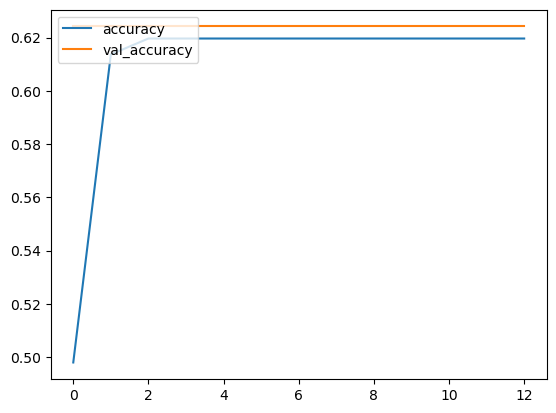

________________________________________________________________________________________________________________________________________________________________________________________________________


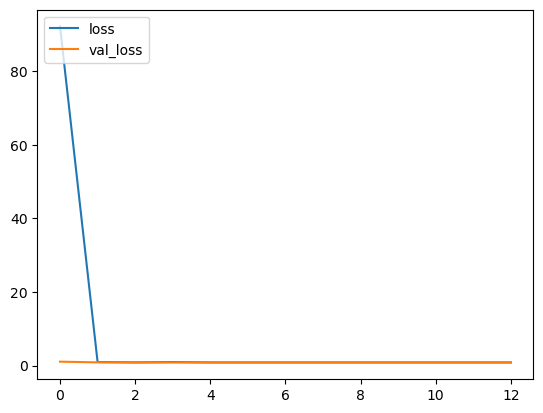

In [48]:
plot_loss_accuracy_curves(history_model_3rd_trail)

**Observation**

- From the above plots and training verbose, we can noticed that the model is quit good.
- The accuracy isn't good.It is only  0.6241 % 
- The good thing in this model that there is no overfittig. The accuracy in train and test data are almost the same 
- So, we expect that the accuracy in kaggle will be the same
- This curve is slighty smooth than the previous trail
- Dropout and early stopping have a good impact in preventing overfitting
- There is no improvement in accuracy.This trail is similar as the 1st trail
- we expect that this trail will achieve the same score as the 1st trail


In [ ]:
Submission(model_3rd_trail , "3rd_trail")
model_save(model_3rd_trail , "3rd_trail")

**Observation**

- Score in kaggle : 0.62038 % (The score exactly as the first trail as we expected)



In [ ]:
#clear session
tf.keras.backend.clear_session()

# 5th trail
------------------
-----------------


In this trail, we will 
- text part :
    - Replace LSTM with GRU as :
        - In terms of model training speed, GRU is 29.29% faster than LSTM for processing the same dataset 
        - in terms of performance, GRU performance will surpass LSTM in the scenario of long text and small dataset, and inferior to LSTM in other scenarios.
- Image part:
    - Use the same architecture as the 2nd trail. 
we expect that this changes will improve the performance
        
In this trail, we handled:

- Text part:

    - We used Embedding layer enables us to convert each word into a fixed length vector of defined size. The resultant vector is a dense one with having real values instead of just 0's and 1's. The fixed length of word vectors helps us to represent words in a better way along with reduced dimensions.

    - Then we used an GRU layer and vary the number of units 

- Image part:

- we used convolutional neural network layer with 64 filters, and a 5x5 mask, no padding , one stride with relu as activation function .
- Then we used max pooling layer with a 2x2 mask,it reduced the size to 62x62x64

- Followed by another convolutional neural network layer with 32 filters, and a 7x7 mask, no padding , one stride 

- Then we used max pooling layer with a 2x2 mask,it reduced the size to 23x23x32


- After that, we used flatten layer to flatten the multi-dimensional input tensors into a single dimension that it was ( 16928,).








In [51]:
averaged_4th_trail = text_model('gru')
flattened_4th_trail = image_model()
model_4th_trail = build_model(averaged_4th_trail , flattened_4th_trail , 1 , 0 , weights_focal = False)
history_model_4th_trail , model_4th_trail = fit_model(model_4th_trail)

Model: "model_2"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_2 (InputLayer)           [(None, 128, 128, 2  0           []                               

                                )]                                                                

                                                                                                  

 conv2d_5 (Conv2D)              (None, 124, 124, 64  3264        ['input_2[0][0]']                

                                )                                                                 

                                                                                                  

 max_pooling2d_5 (MaxPooling2D)  (None, 62, 62, 64)  0           ['conv2d_5[0][0]']               

                                                                                 

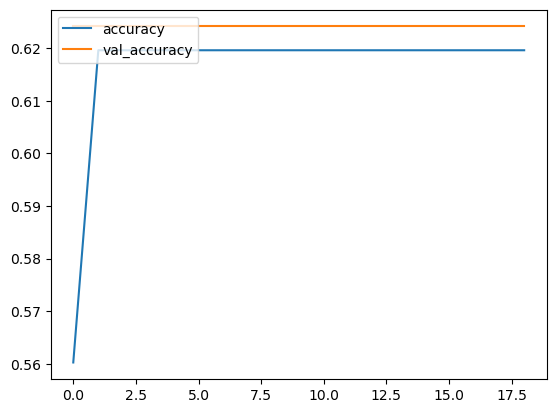

________________________________________________________________________________________________________________________________________________________________________________________________________


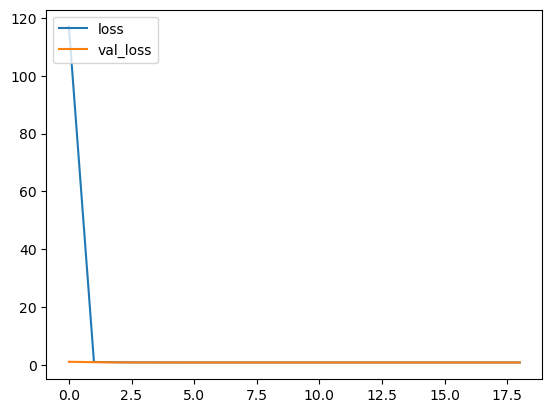

In [52]:
plot_loss_accuracy_curves(history_model_4th_trail)

**Observation**

- From the above plots and training verbose, we can noticed that the model is quit good.
- The accuracy isn't good.It is only  0.6241 % 
- The good thing in this model that there is no overfittig. The accuracy in train and test data are almost the same 
- So, we expect that the accuracy in kaggle will be the same
- This curve is slighty smooth than the previous trail
- Without any drop out layer, the model handle the overfitting. It is a great thing that GRU can handle overfitting
- There is no improvement in accuracy.This trail is similar as the 1st trail
- we expect that this trail will achieve the same score as the 1st trail


In [53]:
Submission(model_4th_trail , "4th_trail")
model_save(model_4th_trail , "4th_trail")

230/230 [==============================] - 73s 315ms/step

probabilities of predicted price

[[0.62022805 0.31507713 0.06469464]

 [0.6202283  0.31507707 0.06469455]

 [0.6202283  0.3150771  0.06469458]

 ...

 [0.6202283  0.31507707 0.06469455]

 [0.62022746 0.3150776  0.06469501]

 [0.6202273  0.3150776  0.06469508]]

____________________________________________________________________________________________________

values of of predicted price :

[0 0 0 ... 0 0 0]

counts of classes predicted in submitted file

<bound method DataFrame.value_counts of         id  price

0        0      0

1        1      0

2        2      0

3        3      0

4        4      0

...    ...    ...

7355  7626      0

7356  7627      0

7357  7628      0

7358  7629      0

7359  7630      0



[7360 rows x 2 columns]>


**Observation**

- Score in kaggle : 0.62038 % (The score exactly as the first trail as we expected)



In [54]:
#clear session
tf.keras.backend.clear_session()

# 6th trail
----------------
---------------

In this trail, we will 
- In text part :
    - replace GRU layer with bi-directional lstm layer as Bi-LSTMs usually provide slightly better results than using a single LSTM for most NLP tasks, not only Named Entity Recognition, because a word's context in a sentence includes future words as well as previous words.
    
- In Image part:
    - same as the 3rd  trail 

we expect that this changes will improve the performance
        
In this trail, we handled:

- Text part:

    - We used Embedding layer enables us to convert each word into a fixed length vector of defined size. The resultant vector is a dense one with having real values instead of just 0's and 1's. The fixed length of word vectors helps us to represent words in a better way along with reduced dimensions.

    - Then we used abi-directional lstm layer and vary the number of units (10)

- Image part:

- we used convolutional neural network layer with 64 filters, and a 5x5 mask, no padding , one stride with relu as activation function .
- Followed by dropout layer 
- Then we used max pooling layer with a 2x2 mask,it reduced the size to 62x62x64

- Followed by another convolutional neural network layer with 64 filters, and a 7x7 mask, no padding , one stride and drop out layer follow it .

- Then we used max pooling layer with a 2x2 mask,it reduced the size to 28x28x64
- Another convolutional neural network layer ,dropout and maxpooling layer

- After that, we used flatten layer to flatten the multi-dimensional input tensors into a single dimension that it was (1152, ).


In [29]:
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPool2D, Dropout

averaged_5th_trail = text_model('bidirect')
flattened_5th_trail = image_model(drop = True , conv2d =True)
model_5th_trail = build_model(averaged_5th_trail , flattened_5th_trail , 1 , 0 , weights_focal = True)
history_model_5th_trail , model_5th_trail = fit_model(model_5th_trail)


Model: "model"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_2 (InputLayer)           [(None, 128, 128, 2  0           []                               

                                )]                                                                

                                                                                                  

 conv2d (Conv2D)                (None, 124, 124, 64  3264        ['input_2[0][0]']                

                                )                                                                 

                                                                                                  

 dropout (Dropout)              (None, 124, 124, 64  0           ['conv2d[0][0]']                 

                                )                                                  

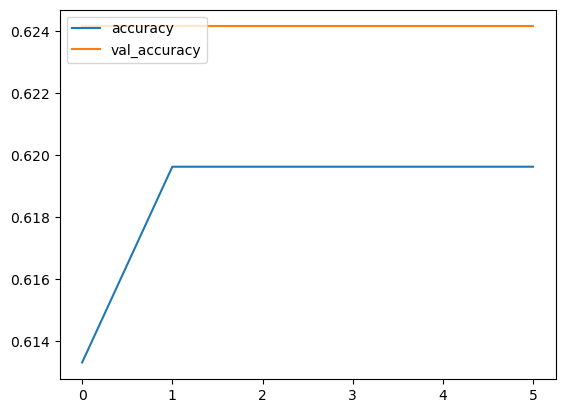

________________________________________________________________________________________________________________________________________________________________________________________________________


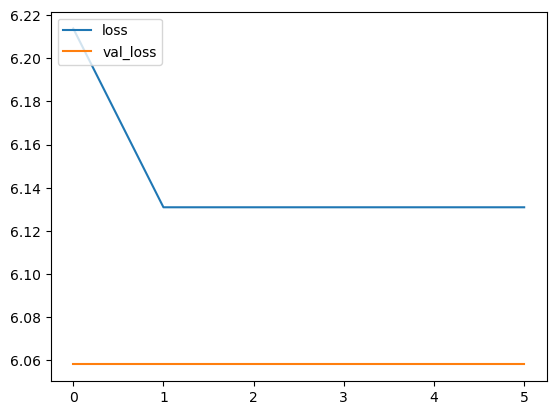

In [30]:
plot_loss_accuracy_curves(history_model_5th_trail)

**Observation**

- From the above plots and training verbose, we can noticed that the model is quit good.
- There is no improvement in accuracy.This trail is similar as the previous trails still the high score one is the 2nd trail
- The accuracy isn't good.It is only 0.6241 %
- The good thing in this model that there is no overfittig. The accuracy in train and test data are almost the same
- So, we expect that the accuracy in kaggle will be the same

we expect that this trail will achieve score on kaggle  same as the previous trails

In [31]:
Submission(model_5th_trail , "5th_trail")
model_save(model_5th_trail , "5th_trail")

230/230 [==============================] - 26s 111ms/step

probabilities of predicted price

[[1.0000000e+00 0.0000000e+00 0.0000000e+00]

 [1.0000000e+00 0.0000000e+00 0.0000000e+00]

 [9.9218994e-01 9.1849722e-04 6.8914564e-03]

 ...

 [9.9219090e-01 9.2125707e-04 6.8878522e-03]

 [9.9220324e-01 9.1885030e-04 6.8779546e-03]

 [9.9217039e-01 9.2139794e-04 6.9082417e-03]]

____________________________________________________________________________________________________

values of of predicted price :

[0 0 0 ... 0 0 0]

counts of classes predicted in submitted file

<bound method DataFrame.value_counts of         id  price

0        0      0

1        1      0

2        2      0

3        3      0

4        4      0

...    ...    ...

7355  7626      0

7356  7627      0

7357  7628      0

7358  7629      0

7359  7630      0



[7360 rows x 2 columns]>


**Observation**

- Score on Kaggle : 62038 % ( As we expected,There is no improvement)

In [ ]:
#clear session
tf.keras.backend.clear_session()

# 7 th trail(MultiModality Multiobjective) Using Transfer learning
---------------
-----------------


In this trail, we will 
- In text part :
    - we will use the same architecture as the 1st trail (embedding average)
    
- In Image part:
    - we  use a pretrained model VGG16 as we know the pretrained model achieve high performance in most cases compared to traditional CNN models 

we expect that this changes will improve the performance
        
In this trail, we handled:

- Text part:

     - We used Embedding layer enables us to convert each word into a fixed length vector of defined size. The resultant vector is a dense one with having real values instead of just 0's and 1's. The fixed length of word vectors helps us to represent words in a better way along with reduced dimensions.

    - Then we used averaged layer to compute the mean of the embeddings to reduce the rank of the embedding.


- Image part:

    - we used VGG16 pretrained model

this time, we will predict two outputs (type and price )

In [30]:
def Resize_image_pretrained(filepath):
    try:
    # Resize original images into 48 x 48 x 3 
        image = Image.open(filepath).resize((48,48))
        arr = np.array(image)
        # Check if there is an image is grayscale and conert it into rgb and resize it
        if len(arr.shape)!= 3 :
            print("GrayScale Image" , filepath)
            image = Image.open(filepath).convert('RGB').resize((48,48))
            arr = np.array(image)
    except:
        print(filepath)
        arr = np.zeros((48, 48, 3))
        
    return arr

In [27]:
# Resize train images into 48 x48 x 3 
x_train_image = np.array([Resize_image_pretrained(i) for i in data.image])

/kaggle/input/copy-of-cisc-873-dm-w23-a4/a4/img_train/4176.jpg
GrayScale Image /kaggle/input/copy-of-cisc-873-dm-w23-a4/a4/img_train/5878.jpg
/kaggle/input/copy-of-cisc-873-dm-w23-a4/a4/img_train/6083.jpg


In [47]:
# Resize test images into 48 x48 x 3 same as train images
x_test_image = np.array([Resize_image_pretrained(i) for i in submission_data['image']]) 

/kaggle/input/copy-of-cisc-873-dm-w23-a4/a4/img_test/7314.jpg


In [32]:
# reshape your input and output 
x_train_text_id = np.array(x_train_text_id, dtype = 'float32')
in_text = keras.Input(batch_shape=(None, max_len))
in_image = keras.Input(batch_shape=(None,48,48,3))
checkpoint_filepath = '/tmp/checkpoint'
#----------------------Image part --------------------------
base_model = tf.keras.applications.VGG16(input_shape=(48,48,3),include_top=False,weights='imagenet')(in_image)
flattened_pretrained = Flatten()(base_model)
# --------------------- Text Part ------------------------
averaged_pretrained = text_model('embedding')
# ------------------ Build Model --------------------
model_pretrained_trail = build_model(averaged_pretrained , flattened_pretrained , 0.5 , 0.5 , weights_focal = False)
history_model_pretrained_trail , model_pretrained_trail = fit_model(model_pretrained_trail)


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(None, 177)]        0           []                               
                                                                                                  
 input_16 (InputLayer)          [(None, 48, 48, 3)]  0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 177, 177)     7080000     ['input_15[0][0]']               
                                                                                                  
 vgg16 (Functional)             (None, 1, 1, 512)    14714688    ['input_16[0][0]']               
                                                                                            

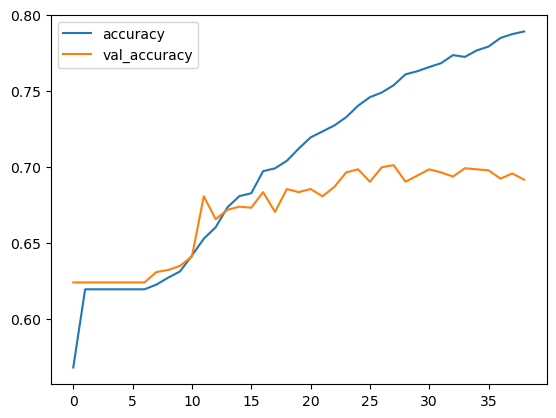

________________________________________________________________________________________________________________________________________________________________________________________________________


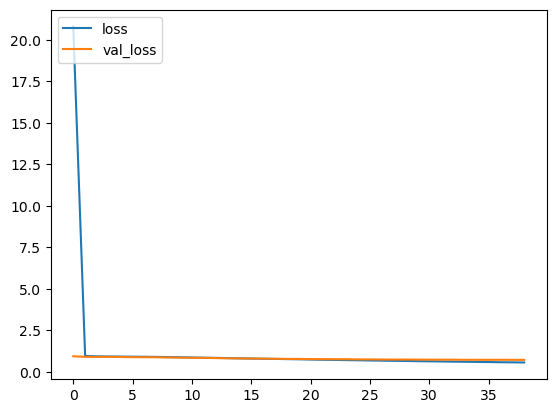

In [49]:
plot_loss_accuracy_curves(history_model_pretrained_trail)

**Observation**

- From the above plots and training verbose, we can noticed that the model doesn't perform well on validation data.
- This is a significant overfitting in this model as we expected
- The accuracy in validation data isn't good.It is only  69.19 % (higher than ther previous trails except the 2nd trail 70%)
- The difference between accuracy in train(78.9%) and validation (69
17 %) is large 
- So, we expect that the model will give us low score in kaggle

In [48]:
Submission(model_pretrained_trail , "pretrained_model" )
model_save(model_pretrained_trail , "pretrained_model")

230/230 [==============================] - 2s 7ms/step
probabilities of predicted price
[[0.8716053  0.10324236 0.02515234]
 [0.92313784 0.0640364  0.01282569]
 [0.9494431  0.03879583 0.01176111]
 ...
 [0.86276793 0.11867621 0.01855591]
 [0.9877437  0.00911802 0.00313827]
 [0.7879836  0.18346207 0.02855434]]
____________________________________________________________________________________________________
values of of predicted price :
[0 0 0 ... 0 0 0]
counts of classes predicted in submitted file
<bound method DataFrame.value_counts of         id  price
0        0      0
1        1      0
2        2      0
3        3      0
4        4      0
...    ...    ...
7355  7626      1
7356  7627      0
7357  7628      0
7358  7629      0
7359  7630      0

[7360 rows x 2 columns]>


**Observation**

- Score in kaggle :  0.67826 % (Surprisely, the accuracy is improved than the previous trail except 2nd trai 68%)
- Although we found the overfitting in the model but it achived high score compared to the previous trail


# Conclusion:

------------------------
--------------------

- Embeddig on text and simple Convolution without focal loss (2nd trail ) achieved high Score compared to other trails (68.342%)

- pretrained model is the second rank in the highest Score 

- Dropout and focal loss have a good impact in preventing overfitting 
- We expect that the rest of models can achieve a good score if we tune them. Just try different hyperparameters, use different initialization methods for the weight and etc........

-----------------------------

-----------------

# Extra Trails : In the comming trail , we will select one feature from 2 features to build model 

# Build model for text only


In [42]:
averaged_lstm = text_model('lstm')
model_lstm_text_only = build_model_one_input(averaged_lstm,in_text, 1 , 0 , weights_focal = False)
history_model_lstm_text_only, model_lstm_text_only = fit_model_one_input(model_lstm_text_only, x_train_text_id)


Model: "model_4"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_1 (InputLayer)           [(None, 177)]        0           []                               

                                                                                                  

 embedding_8 (Embedding)        (None, 177, 177)     7080000     ['input_1[0][0]']                

                                                                                                  

 lstm_5 (LSTM)                  (None, 16)           12416       ['embedding_8[0][0]']            

                                                                                                  

 price (Dense)                  (None, 3)            51          ['lstm_5[0][0]']                 

                                                                                 

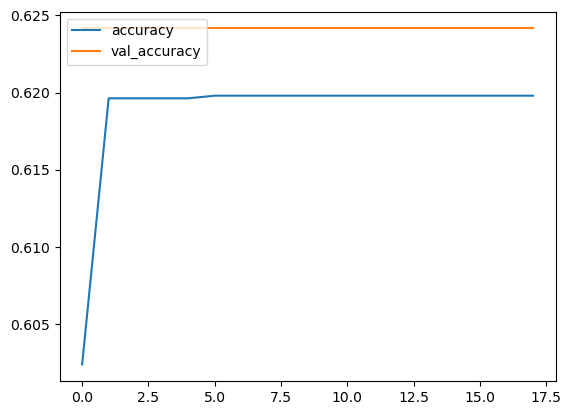

________________________________________________________________________________________________________________________________________________________________________________________________________


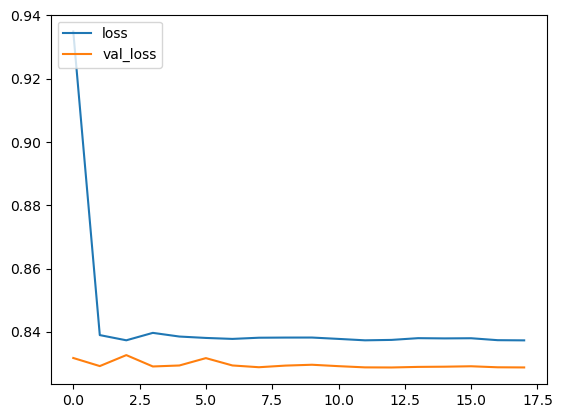

In [50]:
plot_loss_accuracy_curves(history_model_lstm_text_only)

In [51]:
submission_one_input(model_lstm_text_only , "lstm_text_only" ,x_test_text )
model_save(model_lstm_text_only , "lstm_text_only")

230/230 [==============================] - 2s 8ms/step

probabilities of predicted price

[[0.6278251  0.30912906 0.06304578]

 [0.6278251  0.30912906 0.0630458 ]

 [0.6278251  0.30912906 0.06304578]

 ...

 [0.6278251  0.30912906 0.0630458 ]

 [0.6278251  0.30912912 0.0630458 ]

 [0.6278251  0.30912912 0.0630458 ]]

____________________________________________________________________________________________________

values of of predicted price :

[0 0 0 ... 0 0 0]

counts of classes predicted in submitted file

<bound method DataFrame.value_counts of         id  price

0        0      0

1        1      0

2        2      0

3        3      0

4        4      0

...    ...    ...

7355  7626      0

7356  7627      0

7357  7628      0

7358  7629      0

7359  7630      0



[7360 rows x 2 columns]>


In [44]:
averaged_bidirect = text_model('bidirect')
model_bidirect_text_only = build_model_one_input(averaged_bidirect,in_text, 1 , 0 , weights_focal = False)
history_model_bidirect_text_only, model_bidirect_text_only = fit_model_one_input(model_bidirect_text_only,x_train_text_id)

Model: "model_6"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_1 (InputLayer)           [(None, 177)]        0           []                               

                                                                                                  

 embedding_10 (Embedding)       (None, 177, 177)     7080000     ['input_1[0][0]']                

                                                                                                  

 bidirectional_3 (Bidirectional  (None, 10)          7320        ['embedding_10[0][0]']           

 )                                                                                                

                                                                                                  

 price (Dense)                  (None, 3)            33          ['bidirectional_

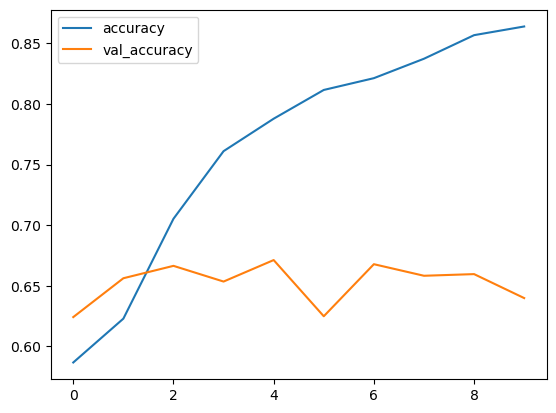

________________________________________________________________________________________________________________________________________________________________________________________________________


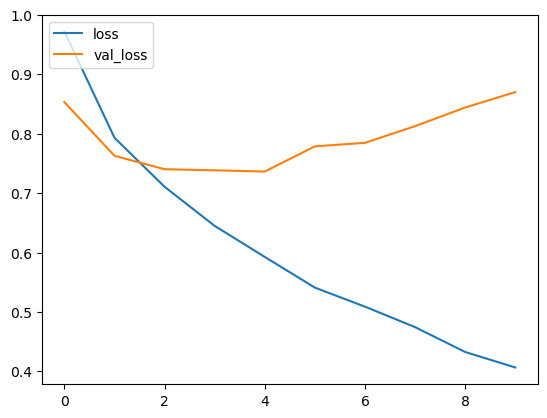

In [45]:
plot_loss_accuracy_curves(history_model_bidirect_text_only)

In [49]:
submission_one_input(model_bidirect_text_only , "bidirect_text_only" ,x_test_text )
model_save(model_bidirect_text_only , "bidirect_text_only")

230/230 [==============================] - 3s 9ms/step

probabilities of predicted price

[[0.92706954 0.05543373 0.01749679]

 [0.9402488  0.04247082 0.01728036]

 [0.9464477  0.03822266 0.0153297 ]

 ...

 [0.86352503 0.11578169 0.02069321]

 [0.9448001  0.03706077 0.01813912]

 [0.934714   0.04939555 0.01589049]]

____________________________________________________________________________________________________

values of of predicted price :

[0 0 0 ... 0 0 0]

counts of classes predicted in submitted file

<bound method DataFrame.value_counts of         id  price

0        0      0

1        1      0

2        2      0

3        3      1

4        4      1

...    ...    ...

7355  7626      1

7356  7627      1

7357  7628      0

7358  7629      0

7359  7630      0



[7360 rows x 2 columns]>


# Model for image only

In [52]:
flatten_conv2d = image_model(conv2d=True)
model_conv2d_image_only = build_model_one_input(flatten_conv2d,in_image, 1 , 0 , weights_focal = False)
history_model_conv2d_image_only, model_conv2d_image_only = fit_model_one_input(model_conv2d_image_only, x_train_image)

Model: "model_7"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_2 (InputLayer)           [(None, 128, 128, 2  0           []                               

                                )]                                                                

                                                                                                  

 conv2d_9 (Conv2D)              (None, 124, 124, 64  3264        ['input_2[0][0]']                

                                )                                                                 

                                                                                                  

 max_pooling2d_9 (MaxPooling2D)  (None, 62, 62, 64)  0           ['conv2d_9[0][0]']               

                                                                                 

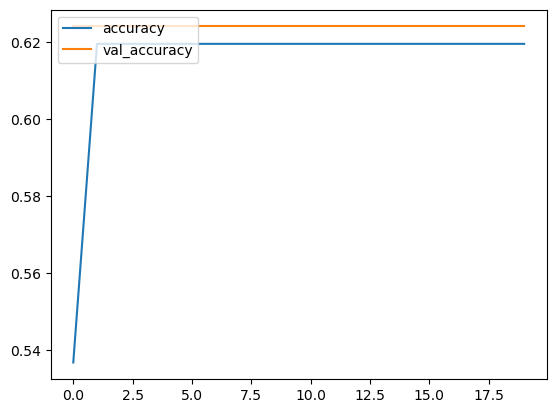

________________________________________________________________________________________________________________________________________________________________________________________________________


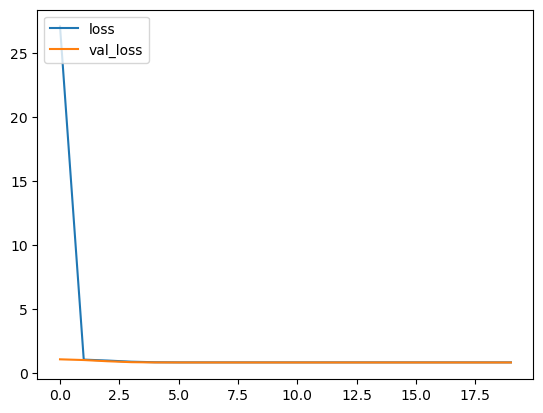

In [53]:
plot_loss_accuracy_curves(history_model_conv2d_image_only)

In [54]:
submission_one_input(model_conv2d_image_only , "conv2d_image_only" ,x_test_image )
model_save(model_conv2d_image_only , "conv2d_image_only")

230/230 [==============================] - 28s 124ms/step

probabilities of predicted price

[[0.620392   0.3153832  0.06422475]

 [0.620392   0.3153832  0.06422475]

 [0.620392   0.3153832  0.06422475]

 ...

 [0.620392   0.3153832  0.06422475]

 [0.620392   0.3153832  0.06422475]

 [0.620392   0.3153832  0.06422475]]

____________________________________________________________________________________________________

values of of predicted price :

[0 0 0 ... 0 0 0]

counts of classes predicted in submitted file

<bound method DataFrame.value_counts of         id  price

0        0      0

1        1      0

2        2      0

3        3      0

4        4      0

...    ...    ...

7355  7626      0

7356  7627      0

7357  7628      0

7358  7629      0

7359  7630      0



[7360 rows x 2 columns]>


In [55]:

flatten_drop = image_model(conv2d=True , drop = True)
model_drop_image_only = build_model_one_input(flatten_drop,in_image, 1 , 0 , weights_focal = False)
history_model_drop_image_only, model_drop_image_only = fit_model_one_input(model_drop_image_only, x_train_image)


Model: "model_8"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_2 (InputLayer)           [(None, 128, 128, 2  0           []                               

                                )]                                                                

                                                                                                  

 conv2d_12 (Conv2D)             (None, 124, 124, 64  3264        ['input_2[0][0]']                

                                )                                                                 

                                                                                                  

 dropout_9 (Dropout)            (None, 124, 124, 64  0           ['conv2d_12[0][0]']              

                                )                                                

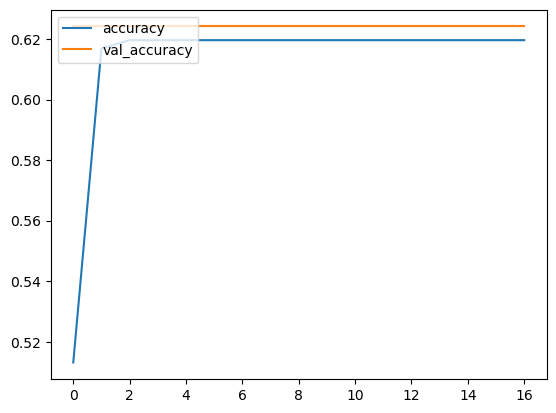

________________________________________________________________________________________________________________________________________________________________________________________________________


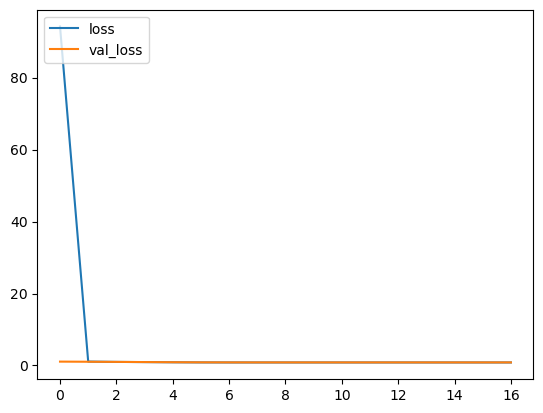

In [56]:
plot_loss_accuracy_curves(history_model_drop_image_only)


In [57]:
submission_one_input(model_drop_image_only , "drop_image_only" ,x_test_image )
model_save(model_drop_image_only , "drop_image_only")

230/230 [==============================] - 28s 123ms/step

probabilities of predicted price

[[0.5381364  0.33909425 0.12276933]

 [0.5381364  0.33909425 0.12276933]

 [0.5381364  0.33909425 0.12276933]

 ...

 [0.5381364  0.33909425 0.12276933]

 [0.5381364  0.33909425 0.12276933]

 [0.5381364  0.33909425 0.12276933]]

____________________________________________________________________________________________________

values of of predicted price :

[0 0 0 ... 0 0 0]

counts of classes predicted in submitted file

<bound method DataFrame.value_counts of         id  price

0        0      0

1        1      0

2        2      0

3        3      0

4        4      0

...    ...    ...

7355  7626      0

7356  7627      0

7357  7628      0

7358  7629      0

7359  7630      0



[7360 rows x 2 columns]>


**Observation**

- There is no difference between the multimodaty model and model with single input 
- Both models are achieved the same result as we disscused before 
- No difference in kaggle score between both 
- Feature image or text or both have the same accuracy 


# ✔️ Is fully-connected model a good one for sequential data? Why? How about for image data? Is it good? Why?

### **Ans :**


- **For sequential data**

No,A fully-connected model is not a good option for sequential data like time-series or natural language processing

- because it fails to capture the temporal dependencies and do not take into account the spatial structure of the data. In contrast, sequential models like recurrent neural networks (RNN) and long short-term memory (LSTM) networks are specifically designed to handle such dependencie.


- **For image data**

No, they have some limitations when working with raw image data, such as they don't preserve the spatial information of the image. To tackle these issues, convolutional neural networks (CNNs) have been developed precisely for image data, which can preserve spatial information and perform much better than fully-connected models.


# ✔️ What is gradient vanishing and gradient explosion, and how GRU/LSTM tries to mitigate this problem?

### **Ans :**

Gradient vanishing and gradient explosion are two common problems that occur during the training of deep neural networks, particularly in recurrent neural networks (RNNs). 

- **Gradient vanishing** refers to the phenomenon where the gradient signal becomes very small as it propagates deeper into the network, which can make it hard for the network to learn long-term dependencies.The gradient is too near to zero cause of wieghts value is too small.This is due to the chain rule, which causes the gradients of lower network layers, or layers several timesteps backward in the case of RNNs, to be multiplied multiple times. When a gradient vanishes, the network can only learn things near the conclusion of a sequence. Memory needs will become a restriction in the case of exploding gradients.


- On the other hand, **gradient explosion** refers to the opposite problem, where the gradient signal becomes very large and causes the network weights to update too much, which can make the training unstable.

- **GRU (Gated Recurrent Unit) and LSTM (Long Short-Term Memory)** are two types of RNNs that are designed to mitigate these problems by incorporating gating mechanisms. Gating mechanisms allow the network to selectively filter the information that it receives, which helps to regulate the flow of gradients during training.

In LSTM, the gating mechanism consists of three gates: the input gate, forget gate, and output gate. The input gate regulates the amount of new information that is introduced into the network, the forget gate determines what information is retained or forgotten from the previous state, and the output gate regulates the amount of information that is outputted to the next state.

Similarly, in GRU, the gating mechanism consists of two gates: the update gate and reset gate. The update gate controls how much of the new information is incorporated into the current state, while the reset gate controls how much of the previous state is forgotten. By using these gates, GRU and LSTM are able to selectively filter the gradients and prevent them from vanishing or exploding too much, which helps to improve the performance of the network.



# ✔️What is multi-objective/multi-task learning? What is multi-modality learning? How do you use them in this assignment?

### **Ans :** 


- **Multi-objective/multi-task learning** is a machine learning approach where a model is trained to solve multiple related tasks or objectives simultaneously. The idea behind multi-task learning is that different tasks can share common features and learning these common features can improve the model's performance on all tasks.

- **Multi-modality learning** is another machine learning approach that involves learning from multiple types of data or modalities. The idea behind multi-modality learning is that incorporating information from different modalities can help improve the model's performance.The multimodal learning model is capable of supplying a missing modality based on observed ones. The multimodal learning model combines two deep Boltzmann machines, each corresponding to one modality. An additional hidden layer is placed on top of the two Boltzmann Machines to produce the joint representation.

In this assignment, we use both multi-task learning and multi-modality learning. We train a single model to perform two related tasks: price and type. Additionally, we incorporate information from both image and text modalities to train our model. The image and text modalities are fused at different levels of the model architecture to learn the joint representation of both modalities.These two learning mechanisms can be used seperately.  

In this assignment, we will combine them together in some trials and we used them seperately other trials.


our model is defined as:

- Inputs (two modalities):

    - Summary (text data): using only embedding layer /LSTM / GRU / Bi-Directional
 
    - Image (image data)
        - CNN
        - VGG16
- Outputs (two predictions):

- price category [0,1,2]

- Type (optional) we can predict it or not.



# ✔️ What is the difference among xgboost, lightgbm and catboost ? 

### **Ans :**


XGBoost, LightGBM, and CatBoost are all popular gradient boosting frameworks that are used for supervised learning tasks such as classification and regressionused. While they share many similarities, there are some distinct differences among the three:
- Mechanism :
   - CatBoost builds symmetric (balanced) trees, unlike XGBoost and LightGBM which result in asymmetric trees. In every step, leaves from the previous tree are split using the same condition in CatBoost. The feature-split pair that accounts for the lowest loss is selected and used for all the level’s nodes
   - LightGBM uses leaf-wise (best-first) tree growth. It chooses to grow the leaf that minimizes the loss, allowing a growth of an imbalanced tree.
   - XGBoost has a similar approach to LightGBM but uses depth-wise tree growth instead of leaf-wise.
- Performance: LightGBM has been found to be faster than XGBoost, while CatBoost is designed to handle categorical data well.

- Memory usage: LightGBM has a lower memory footprint compared to XGBoost and CatBoost because of its ability to perform better data partitioning.

- Handling missing data: CatBoost can handle missing data more efficiently than XGBoost and LightGBM.

- Regularization: XGBoost is considered to be better at handling regularization as it allows for various types of regularization such as L1, L2, and Elastic net.

- Feature engineering: CatBoost has built-in feature engineering capabilities, which means it can automatically handle different types of features in the data, such as categorical, numerical, and text.


 
In summary, these frameworks have an extensive list of tunable hyperparameters that affect learning and eventual performance. All of them have the ability to execute on either CPUs or GPUs for accelerated learning. The main differences among XGBoost, LightGBM, and CatBoost lie in their performance, memory usage, handling of missing data, regularization, and feature engineering capabilities. The choice among these three models depends on the specific requirements and characteristics of the problem at hand.


- LightGBM uses a novel technique of Gradient-based One-Side Sampling (GOSS) to filter out the data instances for finding a split value while

- XGBoost uses pre-sorted algorithm &Histogram-based algorithm for computing the best split.

- CatBoost tree can predict extra ordinarily faster than either XGBoost or LightGBM.








# ✔️ Problem Formulation
--------------------
------------------------------


## ✔️Define the problem:

- The important part before starting to do any thing, we understand the problem very well to be able to be soundness about features you need and features have effect on your prediction.
   
- One of the biggest problems when people prepare to post a new listing on airbnb is, how much should one ask for? Of course the most intuitive way is to check how other similar postings price their apartment/house. 

- Our goal of this problem is to predict the listing price based on the listing characteristics 🔥🔥, in this way to optimize user experience and lower the bar to be a new host😍 !

- This is a multimodality task which is to estimate the price of an Airbnb listing using multi class classification based on the photo and description provided.

- The price of a new listing, as well as the type of rental being promoted, is predicted using a multi-objective method.

## ✔️ What is the input?
The data is presented in the form of text and images , there is an image and a text summary for each listing.


## ✔️ What is the output?

Type and price range are two of the model's outputs.

## ✔️ What data mining function is required?

1- Importing the Libraries & Loading the Data

2- Data exploration : we used pandas and matplotlib libraries are used to plot the data and .

3- Data Preprocessing: In this step, we cleaned data from missing values ,duplicated rows ,high cardinality features and etc .Also, convert the categorical data to numirical data to make it ready for any type of model classification .
For Text Preprocessing :
    - Tokenization and remove regex and special characters
    - converting text to integer IDs
    - Remove any duplicates
    - Translate text in aother language
For Image preprocessing:
    - Resize the image to be (128X128 x 2)
and for the pretrained model vgg16 we resize it into (48x48x3)

4- Models:
    - Model with Conv2d & Dropout layer
    - Model with LSTM layer for text
    - Model with GRU layer for text
    - Model with Bi-directional Recurrent with LSTM layer
    - Model with average embedding
    - Multi-objective learning with Transfer Learning pretrained model




## ✔️ What could be the challenges?
- Small image dimensions  (128X128) may provide problems because they may not include enough detail or information to effectively anticipate pricing ranges.Also, when I try to make it large , the training time is large and ram is crash.It needs powerful resourses.

- There are different languages that we must deal with it, and there are some languages that we cannot translate. We will talk about them in detail in the preprocessing trial_2 .

## ✔️ What is the impact?
On any Vacation rental platforms, In the agreement between the lessor and the lessee we may want to find answers to the following questions in near real-time:

Does a given piece of information contradict the other?

Does a given piece of information imply the other?

So, the impact of this solution could assist improve relationships and establish confidence with consumers renting these properties by streamlining the workflow for using Airbnb as a host.There is a high impact in optimizing user experience and lower the bar to be a new host

## ✔️ What is an ideal solution?

Airbnb pricing is important to get right, particularly in big cities like London where there is lots of competition and even small differences in prices can make a big difference. It is also a difficult thing to do correctly — price too high and no one will book. Price too low and you’ll be missing out on a lot of potential income.

## ✔️ What is the experimental protocol used and how was it carried out? How did we tune hyper-parameters in the template? What is the search space and what is the criteria to determine good/bad hyper-parameters?


The experimental protocol or procedure used is as follows:

- First, the training and test datasets for a set of rental properties are loaded into pandas dataframes. Images are loaded as greyscale (2 channels), and re-sized into size 128x128x2. Text summaries are also loaded as strings. Price and rental type labels are also loaded, and categorically encoded.



- Next, the training and validation splits are created for the two sets of inputs (images and summaries), as well as the two labels (price and type), where a hold-out validation set of 20% is used.



- Then, the text data is preprocessed by first fitting a tokenizer on all of the text summaries. This creates a vocabulary of 40000 unique words. This tokenizer is used to generate a sequence of integers for each summary using this vocabulary. A max sequence length of 177 words is enforced to truncate long sequences, and to pad shorter sequences with zeros to maintain consistent input dimensions.



- Subsequently, the model is defined for this multi-objective task as follows. Embeddings are generated for the input text, and the average of the embeddings is computed for each sequence. A feature vector is created for the input images by passing their values through a 2D convolutional layer, using 2D max-pooling to reduce the size, and then flattening that output. These output vectors are concatenated and passed to a dense layer using softmax activation to perform separate multi-class classification tasks on price and type labels The model uses Adam for tuning weights, sparse categorical cross-entropy loss, and sparse categorical accuracy for evaluation for both objectives. The loss with respect to each task is weighted equally when computing the overall loss of the model. We use the sparse version of these metrics as our categorical labels are integers instead of being one-hot encoded.



- The model is trained for 50 epochs with a batch size of 200 and a hold-out validation set of 20%. Early stopping is used to make training more efficient and to also prevent overfitting. Once training stops, the model is used to make predictions on the test set format them for submission. The submission only contains the price categories for each listing as per the assignment objective, despite the multi-objective approach.


